In [1]:
%matplotlib inline
import matplotlib.pyplot as plt
from fastai.vision import *
from fastai.metrics import accuracy
from fastai.basic_data import *
from skimage.util import montage
import pandas as pd
from torch import optim
import re
import json
import cv2
import albumentations
from fastai.callbacks.hooks import num_features_model
from torch.nn import L1Loss



In [2]:
import numpy as np
import torch
import pandas as pd
import random
import string

# https://github.com/benhamner/Metrics/blob/master/Python/ml_metrics/average_precision.py
def apk(actual, predicted, k=10):
    if len(predicted)>k:
        predicted = predicted[:k]

    score = 0.0
    num_hits = 0.0

    for i,p in enumerate(predicted):
        if p in actual and p not in predicted[:i]:
            num_hits += 1.0
            score += num_hits / (i+1.0)

    if not actual:
        return 0.0

    return score / min(len(actual), k)

def mapk(actual, predicted, k=10):
    return np.mean([apk(a,p,k) for a,p in zip(actual, predicted)])

def map5kfast(preds, targs, k=10):
    predicted_idxs = preds.sort(descending=True)[1]
    top_5 = predicted_idxs[:, :5]
    scores = torch.zeros(len(preds), k).float()
    for kk in range(k):
        scores[:,kk] = (top_5[:,kk] == targs).float() / float((kk+1))
    return scores.max(dim=1)[0].mean()

def map5(preds,targs):
    if type(preds) is list:
        return torch.cat([map5fast(p, targs, 5).view(1) for p in preds ]).mean()
    return map5kfast(preds,targs, 5)

def top_5_preds(preds): return np.argsort(preds.numpy())[:, ::-1][:, :5]

def top_5_pred_labels(preds, classes):
    top_5 = top_5_preds(preds)
    labels = []
    for i in range(top_5.shape[0]):
        labels.append(' '.join([classes[idx] for idx in top_5[i]]))
    return labels

def create_submission(preds, data, name, classes=None):
    if not classes: classes = data.classes
    sub = pd.DataFrame({'Image': [path.name for path in data.test_ds.x.items]})
    sub['Id'] = top_5_pred_labels(preds, classes)
    sub.to_csv(f'subs/{name}.csv.gz', index=False, compression='gzip')


def intersection(preds, targs):
    # preds and targs are of shape (bs, 4), pascal_voc format
    max_xy = torch.min(preds[:, 2:], targs[:, 2:])
    min_xy = torch.max(preds[:, :2], targs[:, :2])
    inter = torch.clamp((max_xy - min_xy), min=0)
    return inter[:, 0] * inter[:, 1]

def area(boxes):
    return ((boxes[:, 2]-boxes[:, 0]) * (boxes[:, 3]-boxes[:, 1]))

def union(preds, targs):
    return area(preds) + area(targs) - intersection(preds, targs)

def IoU(preds, targs):
    return intersection(preds, targs) / union(preds, targs)

def name(n=10, print_it=True):
    name = "".join(random.choice(string.ascii_lowercase) for _ in range(n))
    if print_it: print(name)
    return name

In [3]:
j = json.load(open('train-object-detect\\annotations.json'))


In [4]:
len(j)

1423

In [5]:
for i,temp in enumerate(j):
    test=temp['annotations']

In [6]:
import fastai
from fastprogress import force_console_behavior
import fastprogress
fastprogress.fastprogress.NO_BAR = True
master_bar, progress_bar = force_console_behavior()
fastai.basic_train.master_bar, fastai.basic_train.progress_bar = master_bar, progress_bar

In [7]:
SZ = 360


In [8]:
BOX_COLOR = (255, 0, 0)
TEXT_COLOR = (255, 255, 255)

def visualize_bbox(img, bbox, class_id, class_idx_to_name, color=BOX_COLOR, thickness=2):
    x_min, y_min, x_max, y_max = map(int, bbox)
#     x_min, y_min, w, h = bbox
#     x_min, x_max, y_min, y_max = int(x_min), int(x_min + w), int(y_min), int(y_min + h)
    cv2.rectangle(img, (x_min, y_min), (x_max, y_max), color=color, thickness=thickness)
    class_name = class_idx_to_name[class_id]
    ((text_width, text_height), _) = cv2.getTextSize(class_name, cv2.FONT_HERSHEY_SIMPLEX, 0.35, 1)    
    cv2.rectangle(img, (x_min, y_min - int(1.3 * text_height)), (x_min + text_width, y_min), BOX_COLOR, -1)
    cv2.putText(img, class_name, (x_min, y_min - int(0.3 * text_height)), cv2.FONT_HERSHEY_SIMPLEX, 0.35,TEXT_COLOR, lineType=cv2.LINE_AA)
    return img


def visualize(annotations, category_id_to_name):
    img = annotations['image'].copy()
    for idx, bbox in enumerate(annotations['bboxes']):
        img = visualize_bbox(img, bbox, annotations['category_id'][idx], category_id_to_name)
    plt.figure(figsize=(12, 12))
    plt.imshow(img)
    return img

def get_aug(aug, min_area=0., min_visibility=0.):
    return albumentations.Compose(aug, bbox_params={'format': 'pascal_voc', 'min_area': min_area, 'min_visibility': min_visibility, 'label_fields': ['category_id']})

In [9]:
def j2anno(j):
    # bbox coordinates are returned in pascal voc format [x_min, y_min, x_max, y_max]
    im = cv2.imread(f"train-object-detect\\{j['filename']}", cv2.IMREAD_COLOR)
    im = cv2.cvtColor(im, cv2.COLOR_BGR2RGB)
    im = cv2.resize(im, (360,360), interpolation = cv2.INTER_AREA)
    im_height, im_width, _ = im.shape
                    
    orig_im = cv2.imread(f"train-object-detect\\{j['filename']}", cv2.IMREAD_COLOR)
    orig_im_height, orig_im_width, _ = orig_im.shape

    bbox_info = [anno for anno in j['annotations'] if anno['class'] == 'rect'][0]
    orig_bbox = [np.clip(bbox_info['x'], 0, orig_im_width), np.clip(bbox_info['y'], 0, orig_im_height), np.clip(bbox_info['x']+bbox_info['width'], 0, orig_im_width), np.clip(bbox_info['y']+bbox_info['height'], 0, orig_im_height)]
    bbox = [orig_bbox[0] * SZ / orig_im_width, orig_bbox[1] * SZ / orig_im_height, orig_bbox[2] * SZ / orig_im_width,  orig_bbox[3] * SZ / orig_im_height]
    return {'image': im, 'bboxes': [bbox], 'category_id': [0]}
                         
cat2name = {0: 'rect'}

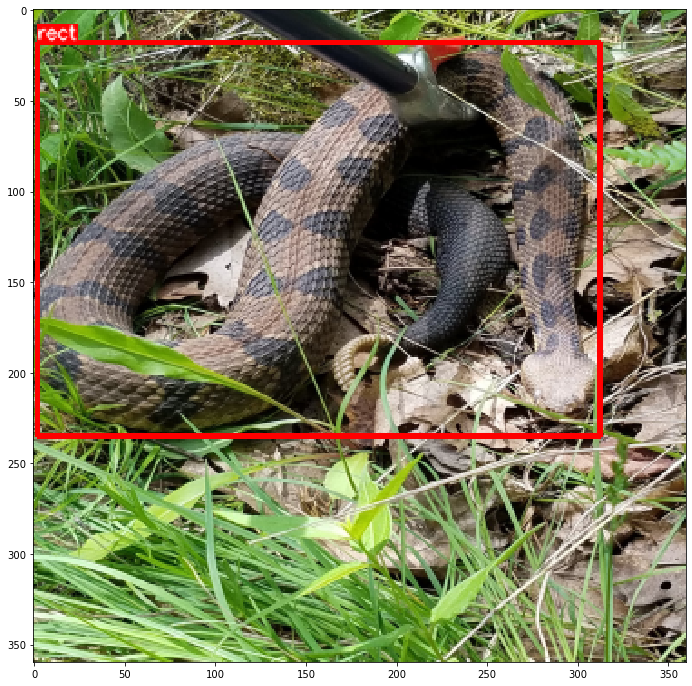

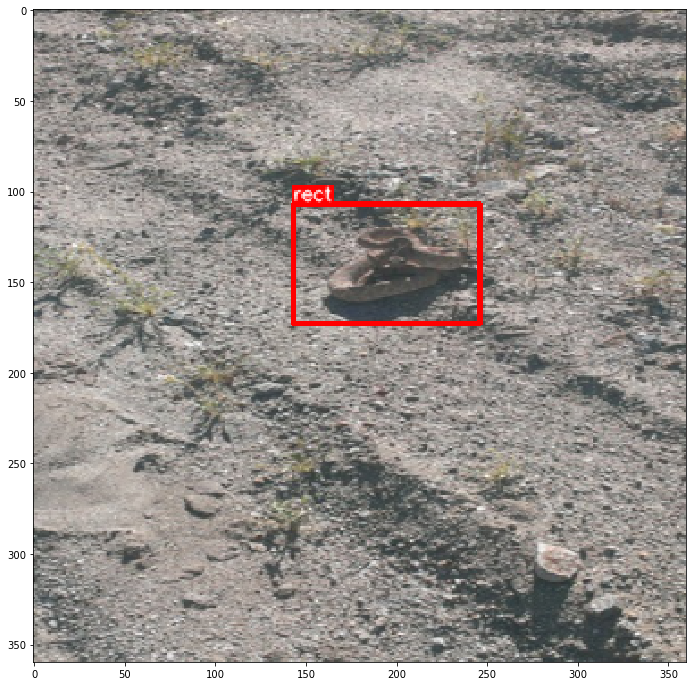

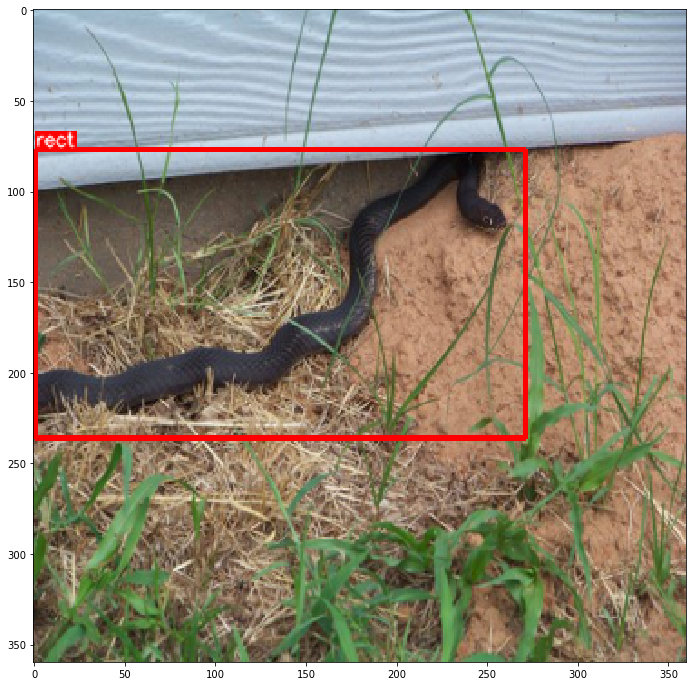

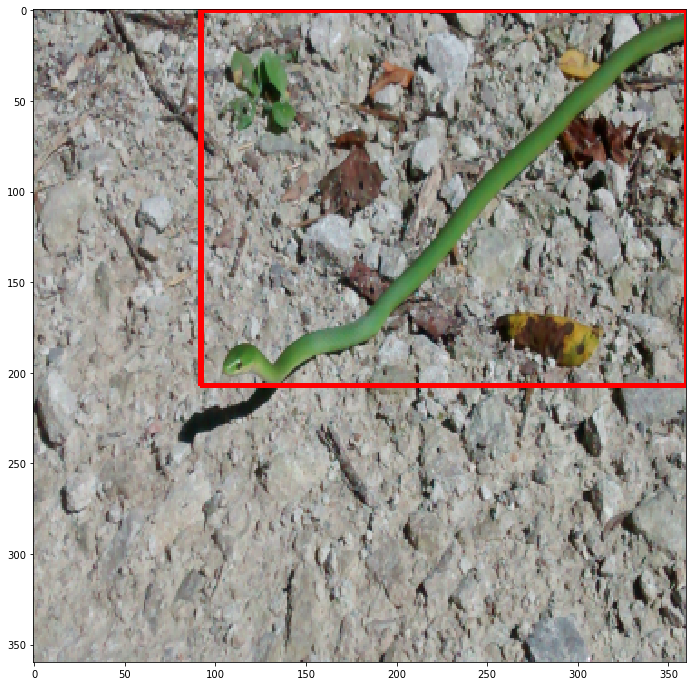

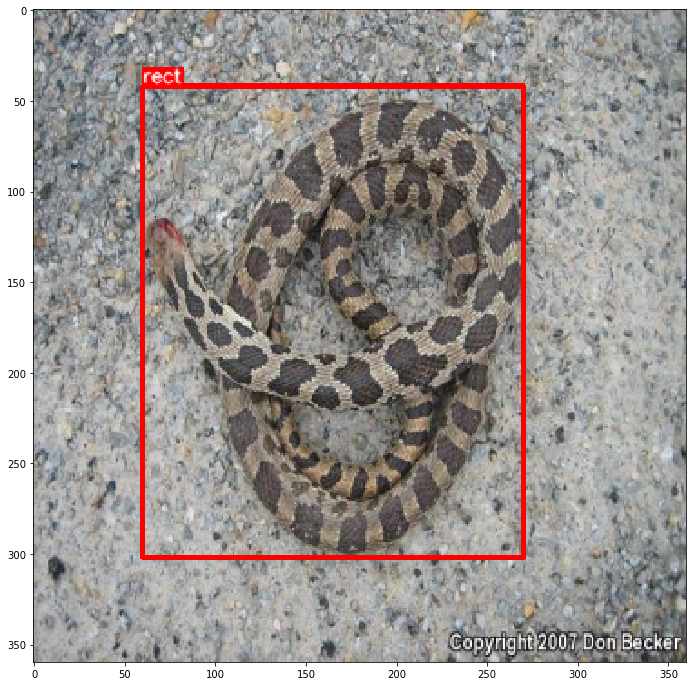

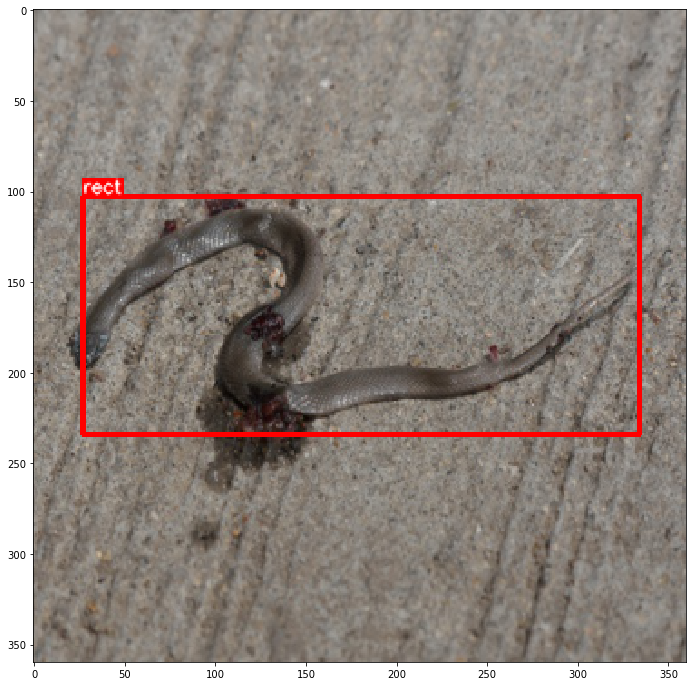

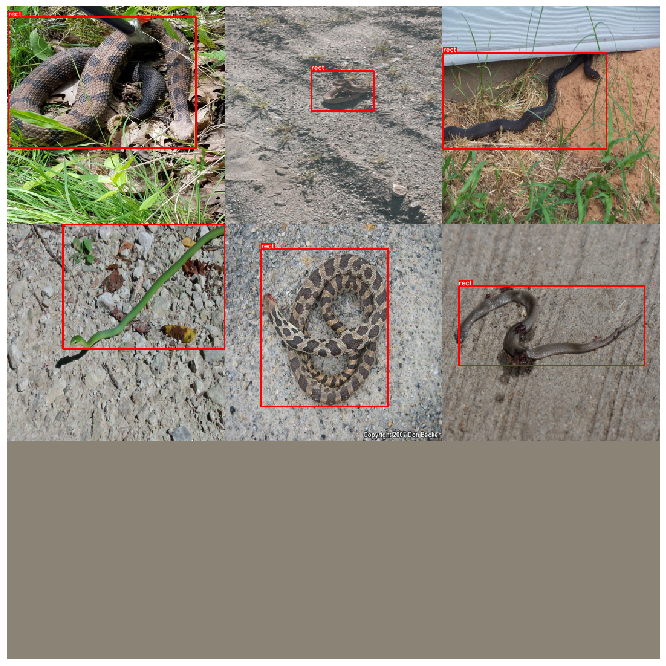

In [10]:
ims = np.stack([visualize(j2anno(j[i]), cat2name) for i in range(6)])
plt.figure(figsize=(12,12))
plt.axis('off')
plt.imshow(montage(np.stack(ims), multichannel=True))

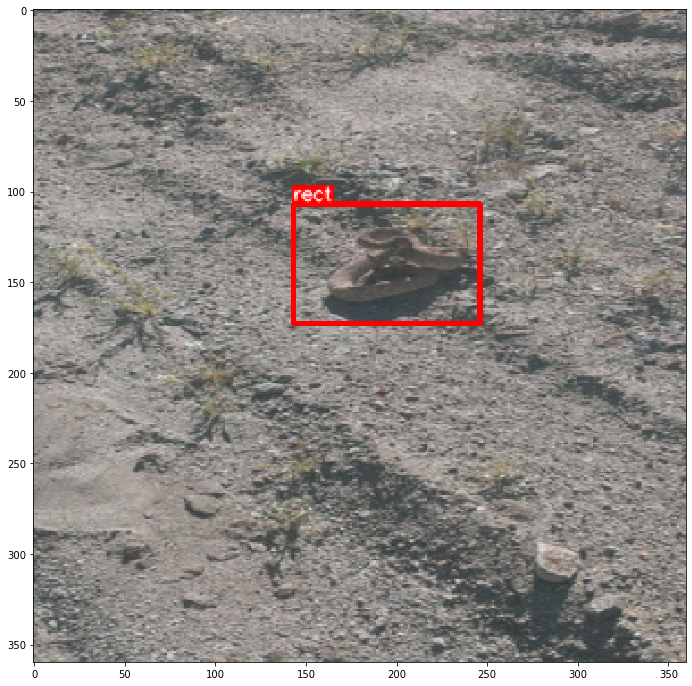

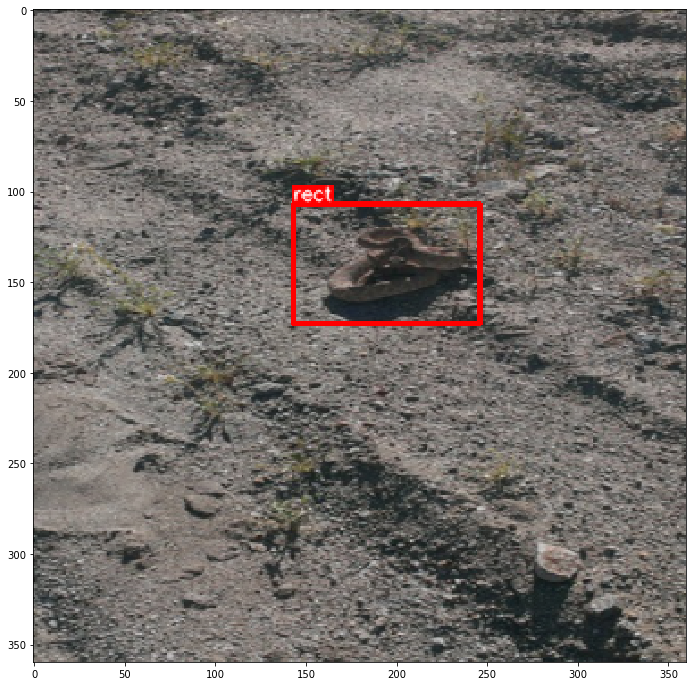

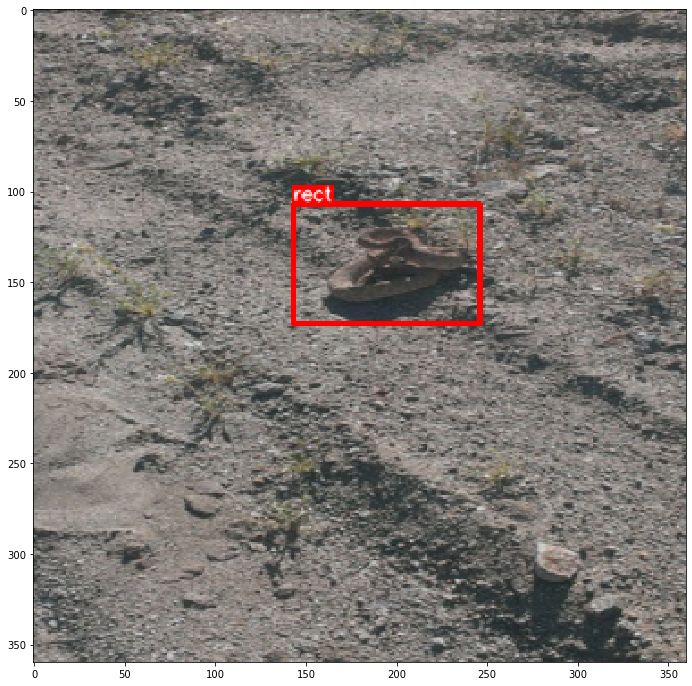

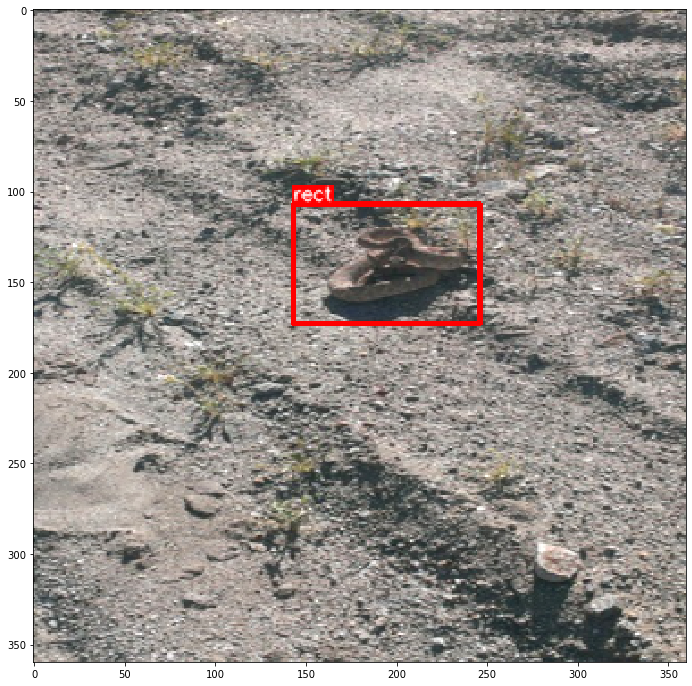

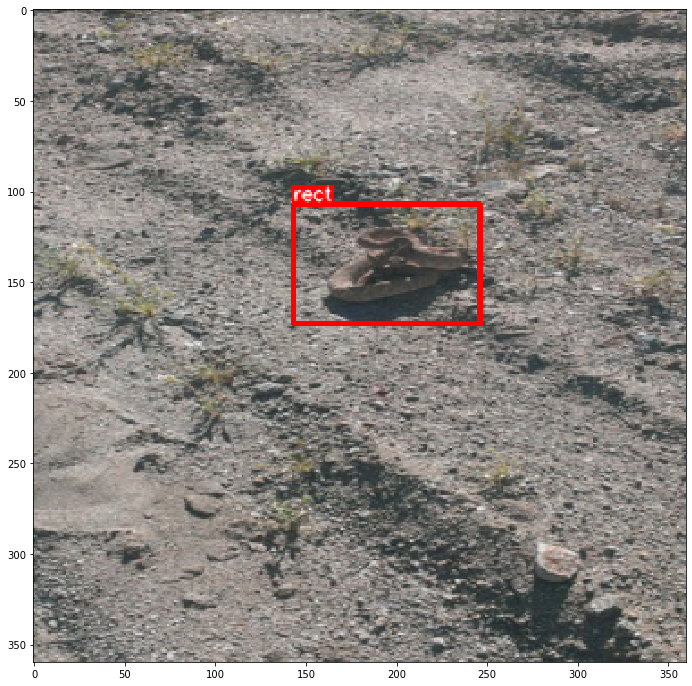

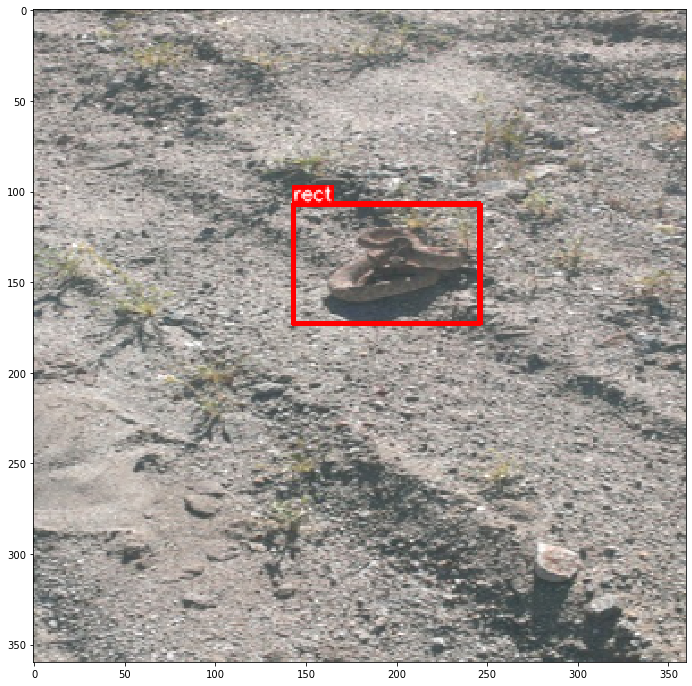

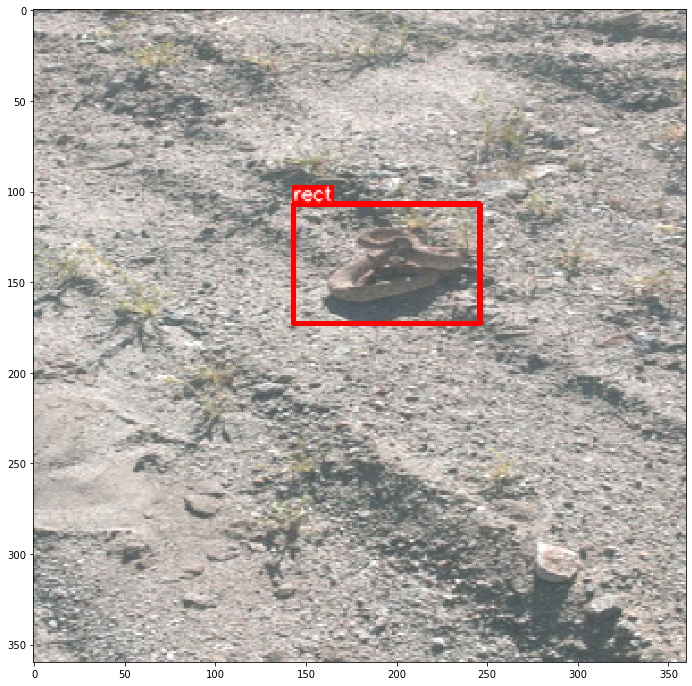

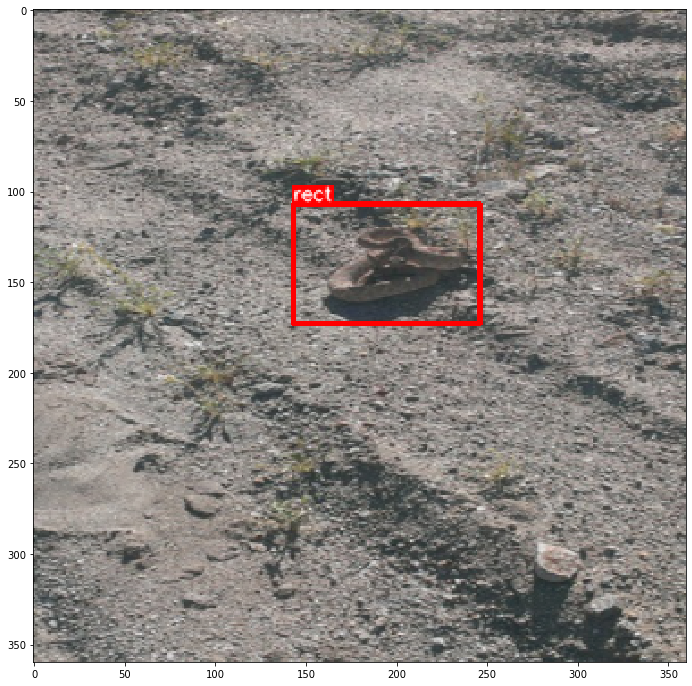

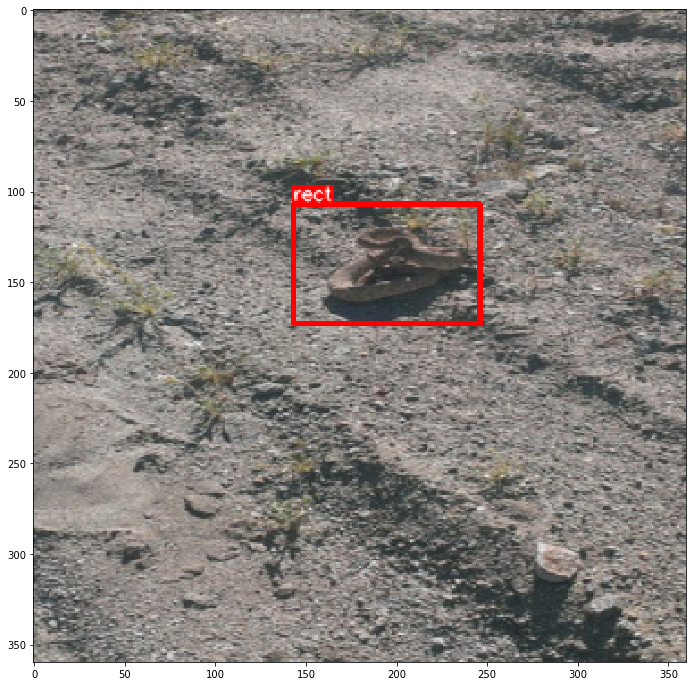

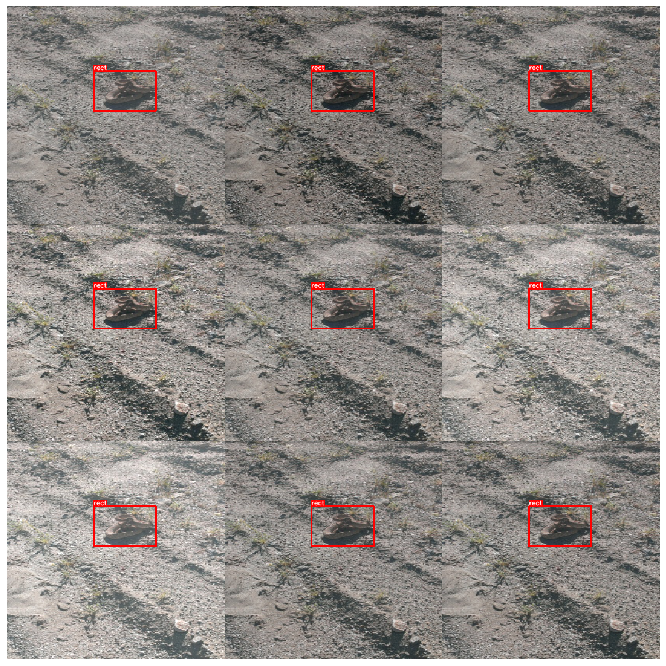

In [11]:
aug = get_aug([albumentations.RandomBrightnessContrast(always_apply=True)])

ims = np.stack([visualize(aug(**j2anno(j[1])), cat2name) for _ in range(9)])
plt.figure(figsize=(12,12))
plt.axis('off')
plt.imshow(montage(np.stack(ims), multichannel=True))

In [12]:
idxs = np.arange(len(j))


In [13]:
idxs

array([   0,    1,    2,    3, ..., 1419, 1420, 1421, 1422])

In [14]:
np.random.seed(0)
np.random.shuffle(idxs)
val_idxs = idxs[:285]


In [15]:

val_j = [anno for i, anno in enumerate(j) if i in val_idxs]
trn_j = [anno for i, anno in enumerate(j) if i not in val_idxs]

In [16]:
len(trn_j), len(val_j)


(1138, 285)

In [17]:
pd.to_pickle([anno['filename'] for anno in val_j], 'val_fns_detection.pkl')

In [18]:
SZ=360

In [19]:
class CustomDataset(Dataset):
    def __init__(self, j, aug=None):
        self.j = j
        if aug is not None: aug = get_aug(aug)
        self.aug = aug
    
    def __getitem__(self, idx):
        item = j2anno(self.j[idx])
        if self.aug: item = self.aug(**item)
        im, bbox = item['image'], np.array(item['bboxes'][0])
        im, bbox = self.normalize_im(im), self.normalize_bbox(bbox)
        
        return im.transpose(2,0,1).astype(np.float32), bbox.astype(np.float32)
    
    def __len__(self):
        return len(self.j)
    
    def normalize_im(self, ary):
        return ((ary / 255 - imagenet_stats[0]) / imagenet_stats[1])
    
    def normalize_bbox(self, bbox):
        return bbox / SZ

In [20]:
trn_ds = CustomDataset(trn_j, [albumentations.RandomBrightnessContrast(always_apply=True)])
val_ds = CustomDataset(val_j)

In [21]:
NUM_WORKERS=0
BS = 12

train_dl = DataLoader(trn_ds, BS, shuffle=True, num_workers=NUM_WORKERS, pin_memory=True)
valid_dl = DataLoader(val_ds, BS, shuffle=False, num_workers=NUM_WORKERS, pin_memory=True)

data_bunch = DataBunch(train_dl, valid_dl)

In [22]:
class SnakeDetector(nn.Module):
    def __init__(self, arch=models.resnet18):
        super().__init__() 
        self.cnn = create_body(arch)
        self.head = create_head(num_features_model(self.cnn) * 2, 4)
        
    def forward(self, im):
        x = self.cnn(im)
        x = self.head(x)
        return x.sigmoid_()

In [23]:
learn = Learner(data_bunch, SnakeDetector(arch=models.resnet50), loss_func=L1Loss())

In [24]:
learn.split([learn.model.cnn[:6], learn.model.cnn[6:], learn.model.head])


Learner(data=DataBunch;

Train: <__main__.CustomDataset object at 0x000001F30A359780>;

Valid: <__main__.CustomDataset object at 0x000001F30A359128>;

Test: None, model=SnakeDetector(
  (cnn): Sequential(
    (0): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
    (1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace)
    (3): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
    (4): Sequential(
      (0): Bottleneck(
        (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
        (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
        (bn3): BatchNorm2

In [25]:
learn.freeze_to(-1)


In [26]:
learn.lr_find()

epoch     train_loss  valid_loss  time    
0         0.238756    #na#        01:04     
1         0.236635    #na#        00:02     
LR Finder is complete, type {learner_name}.recorder.plot() to see the graph.


In [27]:
%time learn.fit_one_cycle(20, 1e-2)


epoch     train_loss  valid_loss  time    
0         0.247761    0.177891    01:08     
1         0.130900    0.108353    01:06     
2         0.113768    0.120477    01:06     
3         0.112186    0.132188    01:06     
4         0.114861    0.143941    01:06     
5         0.115887    0.110492    01:06     
6         0.110301    0.110083    01:05     
7         0.105689    0.097464    01:05     
8         0.104870    0.112786    01:06     
9         0.100969    0.095680    01:06     
10        0.103721    0.138093    01:06     
11        0.102371    0.102576    01:06     
12        0.097116    0.097851    01:09     
13        0.095275    0.102031    01:06     
14        0.093046    0.097990    01:07     
15        0.085261    0.095507    01:07     
16        0.084144    0.091082    01:05     
17        0.079988    0.091330    01:06     
18        0.078467    0.090350    01:06     
19        0.077361    0.091448    01:06     
Wall time: 22min 15s


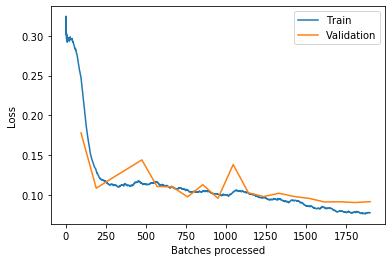

In [28]:
learn.recorder.plot_losses()


In [29]:
def intersection(preds, targs):
    # preds and targs are of shape (bs, 4), pascal_voc format
    max_xy = torch.min(preds[:, 2:], targs[:, 2:])
    min_xy = torch.max(preds[:, :2], targs[:, :2])
    inter = torch.clamp((max_xy - min_xy), min=0)
    return inter[:, 0] * inter[:, 1]

def area(boxes): 
    return ((boxes[:, 2]-boxes[:, 0]) * (boxes[:, 3]-boxes[:, 1]))

def union(preds, targs):
    return area(preds) + area(targs) - intersection(preds, targs)

def IoU(preds, targs):
    return intersection(preds, targs) / union(preds, targs)

In [30]:
learn.metrics = [lambda preds, targs: IoU(preds, targs).mean()]


In [31]:
learn.validate()


[0.09144798, tensor(0.5469)]

In [32]:
learn.unfreeze()


In [33]:
max_lr = 2e-3
lrs = [max_lr/100, max_lr/10, max_lr]

In [34]:
%time learn.fit_one_cycle(80, lrs, div_factor=20)


epoch     train_loss  valid_loss  <lambda>  time    
0         0.078567    0.087941    0.557590  01:23     
1         0.077860    0.091732    0.542069  01:18     
2         0.076655    0.090435    0.546564  01:16     
3         0.076619    0.090239    0.551825  01:16     
4         0.077470    0.088402    0.557929  01:16     
5         0.078692    0.094726    0.539268  01:16     
6         0.075924    0.091595    0.553163  01:16     
7         0.074872    0.087544    0.554942  01:15     
8         0.076323    0.089586    0.544196  01:15     
9         0.074363    0.088919    0.562833  01:15     
10        0.073092    0.086065    0.571688  01:16     
11        0.075825    0.090736    0.544222  01:15     
12        0.080654    0.099075    0.523836  01:15     
13        0.074836    0.087251    0.559481  01:15     
14        0.078381    0.090949    0.536000  01:15     
15        0.082016    0.093237    0.539734  01:15     
16        0.077299    0.089860    0.550879  01:15     
17        0.

In [35]:
preds, targs = learn.get_preds()


In [36]:
predicted_bboxes = ((preds) * SZ).numpy()
targets = ((targs) * SZ).numpy()

In [37]:

def draw_bbox(img, bbox, target=None, color=BOX_COLOR, thickness=2):
    x_min, y_min, x_max, y_max = map(int, bbox)
    cv2.rectangle(img, (x_min, y_min), (x_max, y_max), color=color, thickness=thickness)
    if target is not None:
        x_min, y_min, x_max, y_max = map(int, target)
        cv2.rectangle(img, (x_min, y_min), (x_max, y_max), color=(0,255,0), thickness=thickness)
    return img

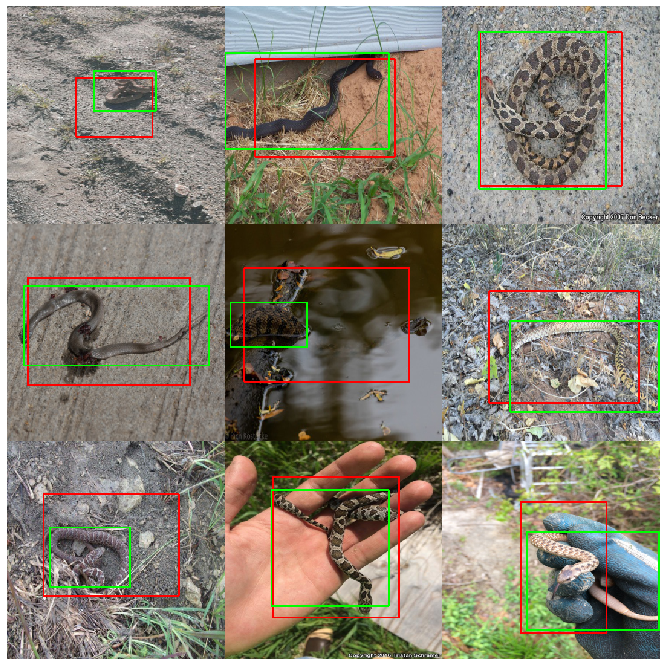

In [38]:
ims = np.stack([draw_bbox(j2anno(val_j[i])['image'], predicted_bboxes[i], targets[i]) for i in range(9)])
plt.figure(figsize=(12,12))
plt.axis('off')
plt.imshow(montage(np.stack(ims), multichannel=True))

In [39]:
learn.save('snake-detection-model')